Copyright (c) 2024, Ákos Makács
All rights reserved.

This source code is licensed under the MIT-style license found in the
LICENSE file in the root directory of this source tree. 

# Personal Information
Name: **Ákos Makács**

StudentID: **15250008**

Email: [**akos.makacs@student.uva.nl**](akos.makacs@student.uva.nl)

Submitted on: **DD.MM.YYYY**

# Data Context
<!-- **In this section you should introduce the datasources and datasets which you will be working with. Explain where they are from as well as their domain. Give an overview of what the context of the data is. You should not spend more than 1 to 2 paragraphs here as the core information will be in the next section.** -->

The analyised dataset is the Microsoft Common Objects in Context (MS COCO) dataset. The latest release of the COCO dataset is an extensive collection of over 120,000 images for training and validation, annotated with bounding boxes and per-instance segmentation masks with 80 object categories. The dataset’s vast diversity of scenes, ranging from urban settings to natural landscapes, and its extensive range of object instances make it an invaluable tool for improving computer vision and machine learning algorithms. As a widely recognized benchmark dataset in the field of machine learning, the COCO dataset is an essential resource for researchers and practitioners alike.

# Data Description

<!-- **Present here the results of your exploratory data analysis. Note that there is no need to have a "story line" - it is more important that you show your understanding of the data and the methods that you will be using in your experiments (i.e. your methodology).**

**As an example, you could show data, label, or group balances, skewness, and basic characterizations of the data. Information about data frequency and distributions as well as results from reduction mechanisms such as PCA could be useful. Furthermore, indicate outliers and how/why you are taking them out of your samples, if you do so.**

**The idea is, that you conduct this analysis to a) understand the data better but b) also to verify the shapes of the distributions and whether they meet the assumptions of the methods that you will attempt to use. Finally, make good use of images, diagrams, and tables to showcase what information you have extracted from your data.**

As you can see, you are in a jupyter notebook environment here. This means that you should focus little on writing text and more on actually exploring your data. If you need to, you can use the amsmath environment in-line: $e=mc^2$ or also in separate equations such as here:

\begin{equation}
    e=mc^2 \mathrm{\space where \space} e,m,c\in \mathbb{R}
\end{equation} -->

<!-- Furthermore, you can insert images such as your data aggregation diagrams like this: -->

<!-- ![image](example.png) -->

### Imports

This cell imports the necessary libraries and modules for our analysis. This includes data manipulation tools such as Pandas and NumPy, visualization libraries like Matplotlib, and COCO API utilities for interacting with the dataset.

In [2]:
# Imports
import os
import json
import pprint
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from collections import Counter
from pycocotools.coco import COCO
from skimage import io
from IPython.display import Markdown


### Data Loading

Here, we define paths to the training, validation, and test annotations of the COCO dataset and initialize COCO API objects for each. This step is crucial for accessing the dataset's annotations in subsequent analyses.

In [3]:
# Define the path to the training, validation and test datasets
src_root = '/gpfs/work3/2/managed_datasets/COCO/processed/'
train_subset = 'train2017'

train_annotations_file = src_root+'annotations/instances_train2017.json'
val_annotations_file = src_root+'annotations/instances_val2017.json'
test_info_file = src_root+'annotations/image_info_test2017.json'

# Initialize a COCO object from the files
coco_train_obj = COCO(train_annotations_file)
coco_val_obj = COCO(val_annotations_file)
coco_test_obj = COCO(test_info_file)

loading annotations into memory...
Done (t=26.64s)
creating index...
index created!
loading annotations into memory...
Done (t=2.49s)
creating index...
index created!
loading annotations into memory...
Done (t=0.33s)
creating index...
index created!


The dataset's annotations are successfully loaded into memory, as indicated by the "Done" messages. This confirms that our paths are correctly set, and the COCO API objects are ready for use.

In the following cell, we load the JSON files containing annotations for the training, validation, and test datasets. This allows us to work directly with the data structures in Python.

In [4]:
# Reading the json file

# Training
with open(train_annotations_file, 'r') as f:
   train_root = json.load(f)

# Test
with open(val_annotations_file, 'r') as f:
   val_root = json.load(f)

# Validation
with open(test_info_file, 'r') as f:
   test_root = json.load(f)

### General Data Structure:

We print the keys of the loaded JSON objects for the train, validation, and test datasets to understand the structure of the data we have loaded.

In [7]:
print("Train Root Keys: ", train_root.keys())
print("Validation Root Keys: ", val_root.keys())
print("Test Root Keys: ", test_root.keys())

Train Root Keys:  dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])
Validation Root Keys:  dict_keys(['info', 'licenses', 'images', 'annotations', 'categories'])
Test Root Keys:  dict_keys(['info', 'images', 'licenses', 'categories'])


The output lists the keys present in each dataset's JSON object, such as 'info', 'licenses', 'images', 'annotations', and 'categories'. This provides insight into the types of information available for each image and annotation in the dataset.
Note, that the Test root keys do not contain an 'annotations' key, which is because of the intended usage of a test set.

In [8]:
print("Info Keys: ", train_root['info'].keys())
print("Licences Keys: ", train_root['licenses'][0].keys())
print("Images Keys: ", train_root['images'][0].keys())
print("Annotations Keys: ", train_root['annotations'][0].keys())
print("Categories Keys: ", train_root['categories'][0].keys())

Info Keys:  dict_keys(['description', 'url', 'version', 'year', 'contributor', 'date_created'])
Licences Keys:  dict_keys(['url', 'id', 'name'])
Images Keys:  dict_keys(['license', 'file_name', 'coco_url', 'height', 'width', 'date_captured', 'flickr_url', 'id'])
Annotations Keys:  dict_keys(['segmentation', 'area', 'iscrowd', 'image_id', 'bbox', 'category_id', 'id'])
Categories Keys:  dict_keys(['supercategory', 'id', 'name'])


The output above lists the keys present in every root JSON object. This information is cruicial to recognize, since these keys have to be used later on for example to calculate the size of images.

Based on the analysis above, the structure of the MS COCO format is the following:
```
{
    "info": info,
    "licenses": [license], 
    "images": [image],  // list of all images in the dataset
    "annotations": [annotation],  // list of all annotations in the dataset
    "categories": [category]  // list of all categories
}

where:

info = {
    "year": int, 
    "version": str, 
    "description": str, 
    "contributor": str, 
    "url": str, 
    "date_created": datetime,
}

license = {
    "id": int, 
    "name": str, 
    "url": str,
}

image = {
    "id": int, 
    "width": int, 
    "height": int, 
    "file_name": str, 
    "license": int,  // the id of the license
    "date_captured": datetime,
    "coco_url": str,
    "flickr_url": str,
}

category = {
    "id": int, 
    "name": str, 
    "supercategory": str,
}

annotation = {
    "id": int, 
    "image_id": int,  // the id of the image that the annotation belongs to
    "category_id": int,  // the id of the category that the annotation belongs to
    "segmentation": RLE or [polygon], 
    "area": float, 
    "bbox": [x,y,width,height], 
    "iscrowd": int,  // 0 or 1,
}
```

Additionally, the MS COCO dataset consists of multiple  image splits, namely train, test and validation. All three has a dedicated folder where they are stored, this way it is easy to refer to a set based on the given stage of the training pipeline

To understand the dataset further, we need to check some of the values of the fields mentioned above. The next cell displays two examples of "supercategory" and "name" from the "categories" object.

In [9]:
data = [
    {
        'Image #': 0,
        'supercategory': train_root['categories'][0]['supercategory'],
        'category': train_root['categories'][0]['name']
    },
    {
        'Image #': 1,
        'supercategory': train_root['categories'][1]['supercategory'],
        'category': train_root['categories'][1]['name']
    }
]

markdown_table = "|| Image # | supercategory | category |\n"
markdown_table += "|---|---|---|---|\n"

for i, row in enumerate(data, start=1):
    markdown_table += f"| {i} | {row['Image #']} | {row['supercategory']} | {row['category']} | \n"

display(Markdown(markdown_table))

|| Image # | supercategory | category |
|---|---|---|---|
| 1 | 0 | person | person | 
| 2 | 1 | vehicle | bicycle | 


Note the difference between the two examples. 
In the first case, the "person" category cannot be specified further, this the supercategory is person as well, however, in tha second case, the category "bicycle" can, in fact be assigned a supercategory, namely "vehicle".

Such structure can have great impact on several object detection or segmentation tasks, for intance if we wish to use higher level categories for example to weight the loss in case the system classified the object as motorcycle instead of bicycle. In this example, the classification is clearly wrong, however, not as wrong as if it would have classified it as something that is not a vehicle.

All the categories can be found in the official documentation [here](https://tech.amikelive.com/node-718/what-object-categories-labels-are-in-coco-dataset/).

### General Image Data Analysis:

We calculate and display basic statistics for the training, validation, and test datasets, such as the number of images, bounding boxes, and categories. This provides an overview of the dataset's scale and diversity.

In [10]:
# Training
n_train_images = len(train_root['images'])
n_train_boxes = len(train_root['annotations'])
n_train_categ = len(train_root['categories'])
train_heights = [x['height'] for x in train_root['images']]
train_widths = [x['width'] for x in train_root['images']]


# Validation
n_val_images = len(val_root['images'])
n_val_boxes = len(val_root['annotations'])
n_val_categ = len(val_root['categories'])
val_heights = [x['height'] for x in val_root['images']]
val_widths = [x['width'] for x in val_root['images']]

# Test
n_test_images = len(test_root['images'])
n_test_categ = len(test_root['categories'])
test_heights = [x['height'] for x in test_root['images']]
test_widths = [x['width'] for x in test_root['images']]

The following cell prepares a comparative table of key statistics across the training, validation, and test splits, such as the number of images, bounding boxes, and average dimensions, which helps in understanding the dataset's composition.

In [11]:
data = [
    {
        "Split": "Training",
        "Number of images": n_train_images,
        "Number of bounding boxes": n_train_boxes,
        "Number of classes": n_train_categ,
        "Height-Max": max(train_heights),
        "Height-Min": min(train_heights),
        "Height-Avg": int(sum(train_heights) / len(train_heights)),
        "Width-Max": max(train_widths),
        "Width-Min": min(train_widths),
        "Width-Avg": int(sum(train_widths) / len(train_widths))
    },
    {
        "Split": "Validation",
        "Number of images": n_val_images,
        "Number of bounding boxes": n_val_boxes,
        "Number of classes": n_val_categ,
        "Height-Max": max(val_heights),
        "Height-Min": min(val_heights),
        "Height-Avg": int(sum(val_heights) / len(val_heights)),
        "Width-Max": max(val_widths),
        "Width-Min": min(val_widths),
        "Width-Avg": int(sum(val_widths) / len(val_widths))
    },
    {
        "Split": "Test",
        "Number of images": n_test_images,
        "Number of bounding boxes": "None",
        "Number of classes": n_test_categ,
        "Height-Max": max(test_heights),
        "Height-Min": min(test_heights),
        "Height-Avg": int(sum(test_heights) / len(test_heights)),
        "Width-Max": max(test_widths),
        "Width-Min": min(test_widths),
        "Width-Avg": int(sum(test_widths) / len(test_widths))
    }
]

markdown_table = "|| Split | Number of images | Number of bounding boxes | Number of classes | Height Max | Height Min | Height Avg | Width Max | Width Min | Width Avg |\n"
markdown_table += "|---|---|---|---|---|---|---|---|---|---|---|\n"


for i, row in enumerate(data, start=1):
    markdown_table += f"| {i} | {row['Split']} | {row['Number of images']} | {row['Number of bounding boxes']} | {row['Number of classes']} | {row['Height-Max']} | {row['Height-Min']} | {row['Height-Avg']} | {row['Width-Max']} | {row['Width-Min']} | {row['Width-Avg']} |\n"

display(Markdown(markdown_table))


|| Split | Number of images | Number of bounding boxes | Number of classes | Height Max | Height Min | Height Avg | Width Max | Width Min | Width Avg |
|---|---|---|---|---|---|---|---|---|---|---|
| 1 | Training | 118287 | 860001 | 80 | 640 | 51 | 484 | 640 | 59 | 577 |
| 2 | Validation | 5000 | 36781 | 80 | 640 | 145 | 483 | 640 | 200 | 573 |
| 3 | Test | 40670 | None | 80 | 640 | 75 | 484 | 640 | 75 | 577 |


The markdown table displays a concise comparison of the dataset's statistics across different splits. It highlights differences in the number of images and bounding boxes, providing a quick snapshot of the dataset's structure.

### Image dimensions:

It is cruicial to understand the distribution of image dimensions, namely height and width, and aspect ratio. These pieces of information can have a huge effect on the training setup.

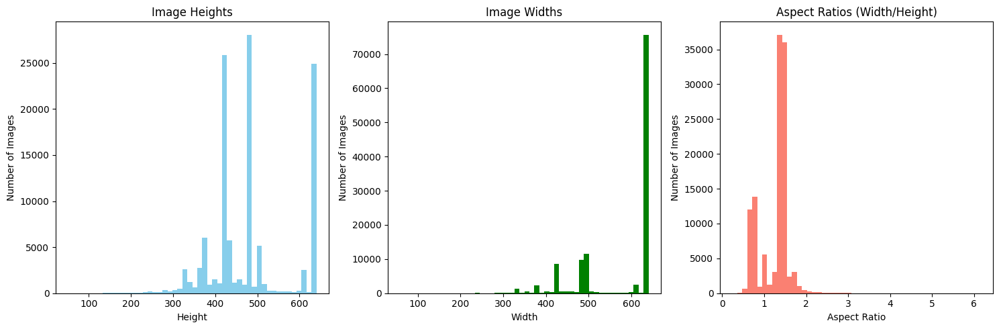

In [12]:
imgIds = coco_train_obj.getImgIds()
images = coco_train_obj.loadImgs(imgIds)

# Extract image dimensions
heights = [img['height'] for img in images]
widths = [img['width'] for img in images]

# Calculate aspect ratios
aspect_ratios = [width / height for width, height in zip(widths, heights)]

# Plot histograms
plt.figure(figsize=(15, 5))

# Heights
plt.subplot(1, 3, 1)
plt.hist(heights, bins=50, color='skyblue')
plt.title('Image Heights')
plt.xlabel('Height')
plt.ylabel('Number of Images')

# Widths
plt.subplot(1, 3, 2)
plt.hist(widths, bins=50, color='green')
plt.title('Image Widths')
plt.xlabel('Width')
plt.ylabel('Number of Images')

# Aspect Ratios
plt.subplot(1, 3, 3)
plt.hist(aspect_ratios, bins=50, color='salmon')
plt.title('Aspect Ratios (Width/Height)')
plt.xlabel('Aspect Ratio')
plt.ylabel('Number of Images')

plt.tight_layout()
plt.show()

Based on the three plots above, the distribution of image sizes are fairly consistent, most of the images are around the same aspect ratio, which is a great feature from the perspective of training. There is, however, need for a preprocessor pipeline before every network, since we have to create uniform images of all the training and validation images. To fully decide how should the final training image be created from the original images, it is important to follow through the analysis to the end, but keep the dimension information in mind.

### Distribution of objects across images

In the following cells, we explore the distribution of the number of objects across all images in the training dataset. By leveraging a histogram, we can visualize how many images contain a specific range of object counts. This analysis is pivotal for understanding object density within the dataset's images.

In [11]:
img2nboxes = Counter(ann['image_id'] for ann in train_root['annotations'])

nboxes_list = list(img2nboxes.values())

min_nboxes = min(nboxes_list)
max_nboxes = max(nboxes_list)
avg_nboxes = int(sum(nboxes_list)/len(nboxes_list))

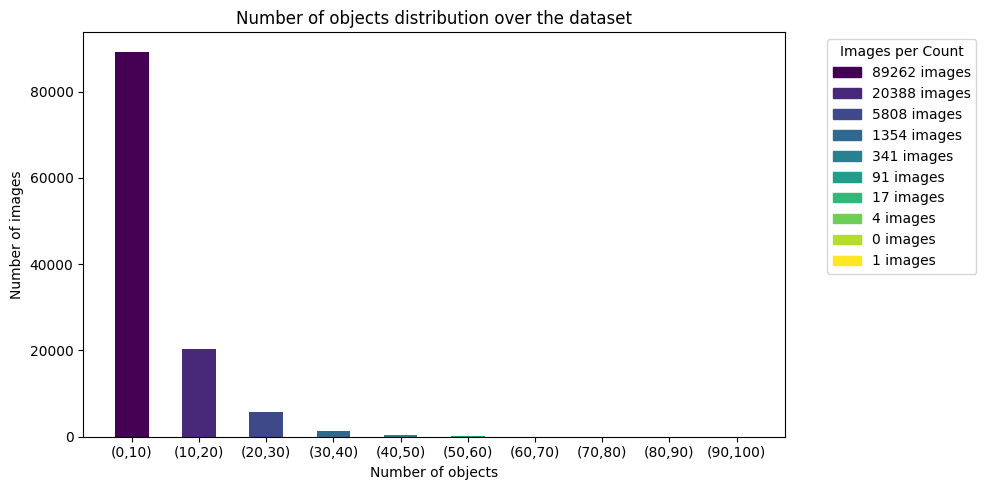

In [35]:
out = pd.cut(nboxes_list, bins=np.arange(0,max_nboxes+10,10), include_lowest=True)

counts = out.value_counts().values
labels = [(int(i.left),int(i.right)) for i in out.value_counts().index.categories]

graph_xind = [i[0] for i in labels]
ticks = [ '('+str(i[0])+','+ str(i[1])+')' for i in labels]

colors = plt.cm.viridis(np.linspace(0, 1, len(counts)))


plt.figure(figsize=(10, 5))
bars = plt.bar(graph_xind, counts, tick_label=ticks, width=5, color=colors)  # Assign colors to bars

plt.xlabel('Number of objects')
plt.ylabel('Number of images')
plt.title('Number of objects distribution over the dataset')

legend_elements = [matplotlib.patches.Patch(facecolor=colors[i], edgecolor=colors[i], label=f'{value} images') for i, value in enumerate(counts)]
plt.legend(handles=legend_elements, title="Images per Count", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

The histogram visualizes the distribution of the number of objects per image across the dataset. By analyzing the colors representing different ranges, we can observe the commonality of images with varying object counts. This visualization aids in understanding the dataset's complexity and can guide preprocessing decisions, such as filtering images by object count for specific tasks.

Here, we calculate and print summary statistics, including the minimum, maximum, and average number of objects per image. These statistics provide a quantitative overview of object distribution within images, supplementing the visual insights from the previous histogram.

In [36]:
print("Number of images having atleast one box: ", len(nboxes_list))
print("Min number of boxes per image: ", min_nboxes)
print("Max number of boxes per image: ", max_nboxes)
print("Avg number of boxes per image: ", avg_nboxes)

Number of images having atleast one box:  117266
Min number of boxes per image:  1
Max number of boxes per image:  93
Avg number of boxes per image:  7


The printed statistics reveal the dataset's variability in terms of object counts per image, highlighting the diversity of images in terms of complexity and potential challenges for object detection algorithms. It also confirms that the dataset is of high quality, there are no images with zero bounding boxes, which eliminates the need for a thorough cleaning process that would remove such images.

### Class wise distribution of objects

This analysis focuses on understanding the distribution of objects across different classes. By counting the number of instances for each category, we gain insight into which classes are most and least represented in the dataset, which is crucial for identifying potential class imbalances.

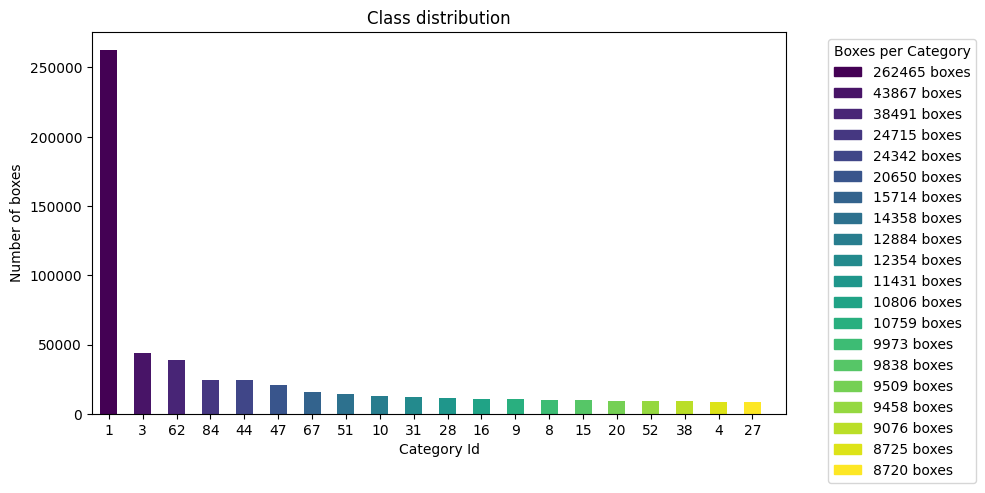

In [11]:
class2nboxes = Counter(ann['category_id'] for ann in train_root['annotations'])

sorted_c2nb = [(k,v)for k, v in sorted(class2nboxes.items(), reverse=True, key=lambda item: item[1])]

# top 20 classes
top = min(len(sorted_c2nb), 20)

y = [i[1] for i in sorted_c2nb[:top]]
x = [i[0] for i in sorted_c2nb[:top]]

colors = plt.cm.viridis(np.linspace(0, 1, len(y)))  # Generates a color map

plt.figure(figsize=(10,5))
bars = plt.bar(np.arange(len(y)), y, width=0.5, tick_label=x, color=colors)
plt.xlim(-0.5, len(y))
plt.xlabel('Category Id')
plt.ylabel('Number of boxes')
plt.title('Class distribution')

legend_elements = [matplotlib.patches.Patch(facecolor=colors[i], edgecolor=colors[i], label=f'{value} boxes') for i, value in enumerate(y)]
plt.legend(handles=legend_elements, title="Boxes per Category", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

### Category Ids:

```1 -> person, 2 -> bicycle, 3 -> car, 4 -> motorcycle, 5 -> airplane, 6 -> bus, 7 -> train, 8 -> truck, 9 -> boat, 10 -> traffic light, 11 -> fire hydrant, 13 -> stop sign, 14 -> parking meter, 15 -> bench, 16 -> bird, 17 -> cat, 18 -> dog, 19 -> horse, 20 -> sheep, 21 -> cow, 22 -> elephant, 23 -> bear, 24 -> zebra, 25 -> giraffe, 27 -> backpack, 28 -> umbrella, 31 -> handbag, 32 -> tie, 33 -> suitcase, 34 -> frisbee, 35 -> skis, 36 -> snowboard, 37 -> sports ball, 38 -> kite, 39 -> baseball bat, 40 -> baseball glove, 41 -> skateboard, 42 -> surfboard, 43 -> tennis racket, 44 -> bottle, 46 -> wine glass, 47 -> cup, 48 -> fork, 49 -> knife, 50 -> spoon, 51 -> bowl, 52 -> banana, 53 -> apple, 54 -> sandwich, 55 -> orange, 56 -> broccoli, 57 -> carrot, 58 -> hot dog, 59 -> pizza, 60 -> donut, 61 -> cake, 62 -> chair, 63 -> couch, 64 -> potted plant, 65 -> bed, 67 -> dining table, 70 -> toilet, 72 -> tv, 73 -> laptop, 74 -> mouse, 75 -> remote, 76 -> keyboard, 77 -> cell phone, 78 -> microwave, 79 -> oven, 80 -> toaster, 81 -> sink, 82 -> refrigerator, 84 -> book, 85 -> clock, 86 -> vase, 87 -> scissors, 88 -> teddy bear, 89 -> hair drier, 90 -> toothbrush```

The bar chart visualizes the class-wise distribution of objects, allowing us to easily identify which categories are more prevalent. This is key for assessing the dataset's balance and may influence the choice of models or techniques to address class imbalance.

A class imbalance is apparent from the chart of the top 20 classes. This imbalance is critical to recognize as it influences model performance, potentially biasing detections towards more frequent categories.

### Class wise bounding box area distribution

We explore the average bounding box area for objects in each class to understand the size distribution of objects across categories. This can highlight differences in object scale that might affect detection performance for smaller or larger objects.

In [12]:
bbox_areas = {}

for ann in train_root['annotations']:
    area = ann['area']
    cat_id = ann['category_id']

    if area <= 0.0:
        continue

    if cat_id in bbox_areas.keys():
        bbox_areas[cat_id].append(area)
    else:
        bbox_areas[cat_id] = [area]


bbox_avg_areas = []

for cat in bbox_areas.keys():
    areas = bbox_areas[cat]
    avg_area = int(sum(areas) / len(areas))

    bbox_avg_areas.append((cat, avg_area))

bbox_avg_areas = sorted(bbox_avg_areas, key = lambda x: x[1])

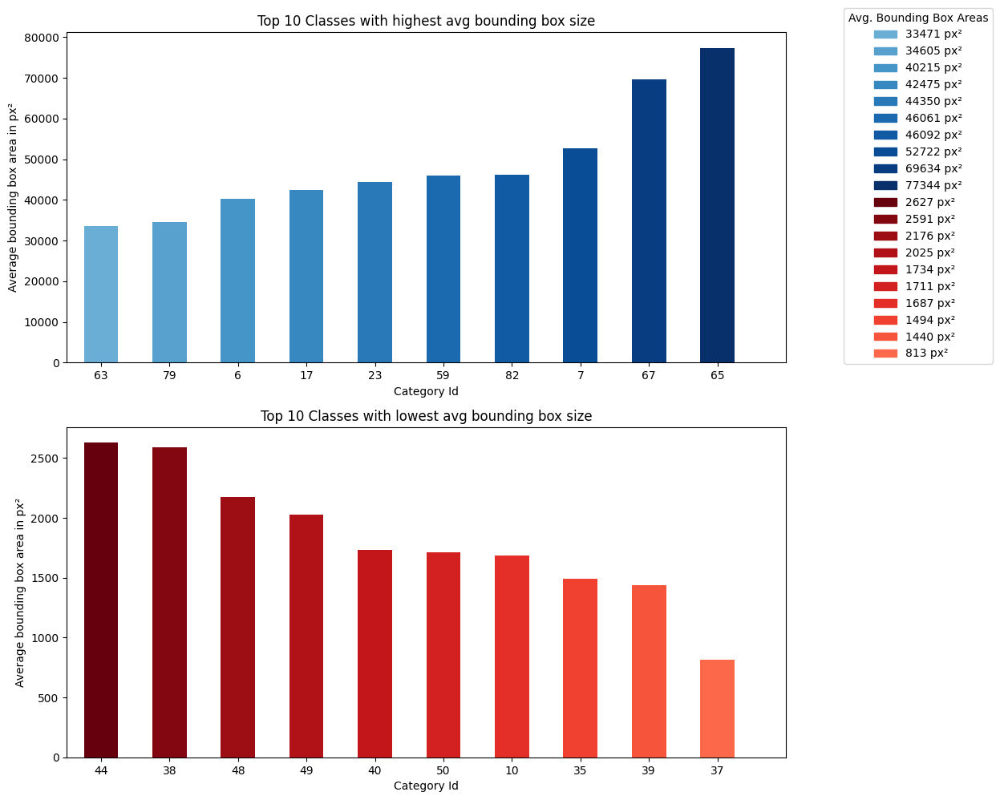

In [14]:
np.set_printoptions(linewidth=110)

top = min(10, len(bbox_avg_areas))

plt.figure(figsize=(10, 10))

# For top classes with highest avg bounding box size
y = [item[1] for item in bbox_avg_areas[-top:]]
x = [item[0] for item in bbox_avg_areas[-top:]]
colors_high = plt.cm.Blues(np.linspace(0.5, 1, len(y)))

plt.subplot(211)
bars_high = plt.bar(np.arange(len(y)), y, width=0.5, tick_label=x, color=colors_high)
plt.xlim(-0.5, len(y))
plt.xlabel('Category Id')
plt.ylabel('Average bounding box area in px²')
plt.title('Top ' + str(top) + ' Classes with highest avg bounding box size')

# For top classes with lowest avg bounding box size, displayed in reverse order
y2 = [item[1] for item in reversed(bbox_avg_areas[:top])]
x2 = [item[0] for item in reversed(bbox_avg_areas[:top])]
colors_low = plt.cm.Reds(np.linspace(1, 0.5, len(y2)))

plt.subplot(212)
bars_low = plt.bar(np.arange(len(y2)), y2, width=0.5, tick_label=x2, color=colors_low)
plt.xlim(-0.5, len(y2))
plt.xlabel('Category Id')
plt.ylabel('Average bounding box area in px²')
plt.title('Top ' + str(top) + ' Classes with lowest avg bounding box size')

# Create a custom legend for Y values (average bounding box areas)
legend_elements_high = [matplotlib.patches.Patch(facecolor=colors_high[i], edgecolor=colors_high[i], label=f'{int(y[i])} px²') for i in range(len(y))]
legend_elements_low = [matplotlib.patches.Patch(facecolor=colors_low[i], edgecolor=colors_low[i], label=f'{int(y2[i])} px²') for i in range(len(y2))]
plt.figlegend(handles=legend_elements_high + legend_elements_low, title="Avg. Bounding Box Areas", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

### Categori Ids:

```1 -> person, 2 -> bicycle, 3 -> car, 4 -> motorcycle, 5 -> airplane, 6 -> bus, 7 -> train, 8 -> truck, 9 -> boat, 10 -> traffic light, 11 -> fire hydrant, 13 -> stop sign, 14 -> parking meter, 15 -> bench, 16 -> bird, 17 -> cat, 18 -> dog, 19 -> horse, 20 -> sheep, 21 -> cow, 22 -> elephant, 23 -> bear, 24 -> zebra, 25 -> giraffe, 27 -> backpack, 28 -> umbrella, 31 -> handbag, 32 -> tie, 33 -> suitcase, 34 -> frisbee, 35 -> skis, 36 -> snowboard, 37 -> sports ball, 38 -> kite, 39 -> baseball bat, 40 -> baseball glove, 41 -> skateboard, 42 -> surfboard, 43 -> tennis racket, 44 -> bottle, 46 -> wine glass, 47 -> cup, 48 -> fork, 49 -> knife, 50 -> spoon, 51 -> bowl, 52 -> banana, 53 -> apple, 54 -> sandwich, 55 -> orange, 56 -> broccoli, 57 -> carrot, 58 -> hot dog, 59 -> pizza, 60 -> donut, 61 -> cake, 62 -> chair, 63 -> couch, 64 -> potted plant, 65 -> bed, 67 -> dining table, 70 -> toilet, 72 -> tv, 73 -> laptop, 74 -> mouse, 75 -> remote, 76 -> keyboard, 77 -> cell phone, 78 -> microwave, 79 -> oven, 80 -> toaster, 81 -> sink, 82 -> refrigerator, 84 -> book, 85 -> clock, 86 -> vase, 87 -> scissors, 88 -> teddy bear, 89 -> hair drier, 90 -> toothbrush```

The dual histograms display the top classes with the largest and smallest average bounding box sizes, respectively. This comparative view provides insights into the variance of object sizes within the dataset, which can inform decisions on scaling and normalization techniques for model training.

### Spatial distribution of object annotations across all images

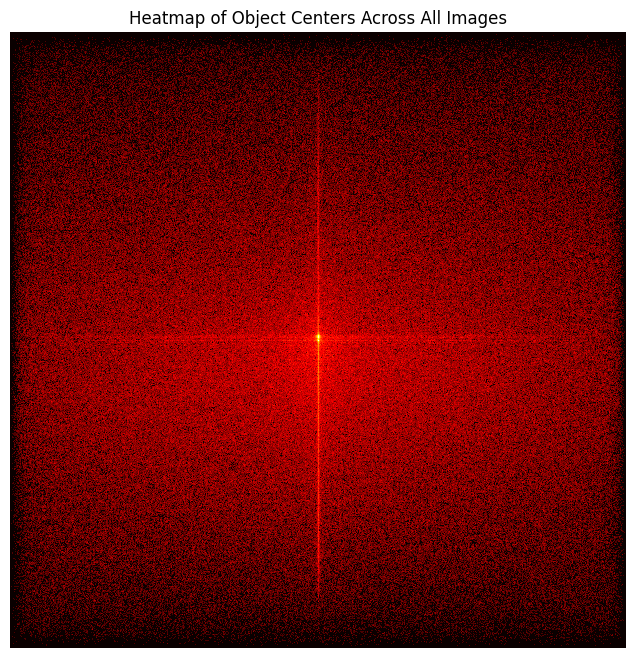

In [118]:
imgIds = coco_train_obj.getImgIds()

heatmap_data = np.zeros((640, 640))

for img_id in imgIds:
    img = coco_train_obj.loadImgs(img_id)[0]
    annIds = coco_train_obj.getAnnIds(imgIds=img['id'])
    anns = coco_train_obj.loadAnns(annIds)

    for ann in anns:
        # Normalize x and y to the heatmap resolution
        bbox = ann['bbox']
        center_x = int((bbox[0] + bbox[2] / 2) * (640 / img['width']))
        center_y = int((bbox[1] + bbox[3] / 2) * (640 / img['height']))
        heatmap_data[center_y, center_x] += 1


plt.figure(figsize=(8, 8))
plt.imshow(np.log1p(heatmap_data), cmap='hot', interpolation='nearest')  # Use log scale for better visibility
plt.axis('off')
plt.title('Heatmap of Object Centers Across All Images')
plt.show()

**Central Bias:** The brightest area in the middle of the heatmap indicates a high concentration of object centers in the center of images. This is a common characteristic in many datasets where subjects are often framed centrally by photographers.

**Horizontal and Vertical Lines:** The distinct vertical and horizontal lines suggest a uniform distribution of object centers along the central axes of images. This could be due to the way images are composed, with subjects frequently positioned along these central axes, or it may reflect a bias in the dataset where objects are more likely to be annotated when they appear in the middle regions.

**Uniformity in Borders:** The relatively uniform but less intense glow around the edges compared to the center suggests that while objects do appear throughout the image, there's a lower frequency of objects located near the edges. This is expected as the focus of images typically does not fall near the edges.

**Implications for Model Training:** The central concentration can impact the training of object detection models, potentially making them less sensitive to objects located near the edges of an image. When training models on this dataset, it may be beneficial to include data augmentation techniques that translate objects to various positions within the frame to reduce central bias.

**Dataset Composition:** The heatmap may reflect the composition of the dataset in terms of common photography practices rather than any specific real-world distribution of objects. It is important to consider this when using the dataset to train models intended for real-world applications where objects may not be centrally aligned.

### Sample visualization

In this part, we randomly select images from the training dataset and load its corresponding annotations. The aim is to visualize how objects are annotated within an image, including their bounding boxes and segmentations. This visualization helps in qualitatively assessing the annotation quality and understanding the dataset's composition.

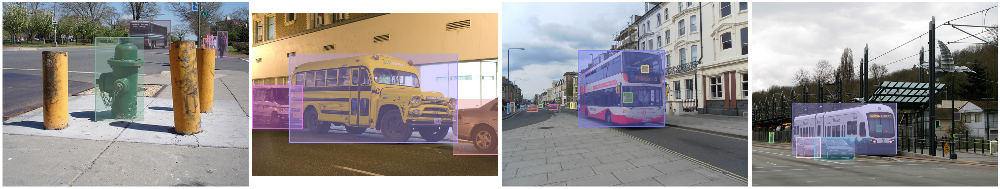

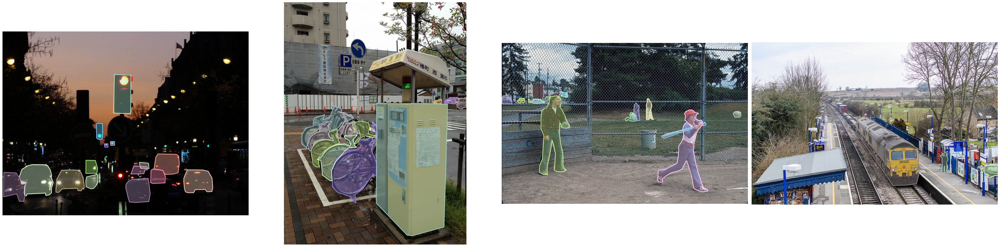

In [117]:
categ_map = {x['id']: x['name'] for x in train_root['categories']}

categories = coco_train_obj.loadCats(coco_train_obj.getCatIds())
box_imgIds = coco_train_obj.getImgIds(catIds=[6]) # cat id 6 -> bus
box_images = coco_train_obj.loadImgs(box_imgIds)

plt.figure(figsize=(40, 10))

for i in range(4):
    img = box_images[i]
    plt.subplot(1, 4, i+1)
    image_path = os.path.join(src_root, train_subset, img['file_name'])
    image = io.imread(image_path)
    plt.axis('off')
    plt.imshow(image)
    annIds = coco_train_obj.getAnnIds(imgIds=img['id'], iscrowd=None)
    annotations = coco_train_obj.loadAnns(annIds)

    for annotation in annotations:
        if 'segmentation' in annotation.keys():
            annotation['segmentation'] = []

    coco_train_obj.showAnns(annotations, draw_bbox=True)

plt.tight_layout()
plt.show()


plt.figure(figsize=(40, 10))

seg_imgIds = coco_train_obj.getImgIds(catIds=[3]) # cat id 3 -> car
seg_images = coco_train_obj.loadImgs(seg_imgIds)


for i in range(4):
    img = seg_images[i]
    plt.subplot(1, 4, i+1)
    image_path = os.path.join(src_root, train_subset, img['file_name'])
    image = io.imread(image_path)
    plt.axis('off')
    plt.imshow(image)



    annIds = coco_train_obj.getAnnIds(imgIds=img['id'], iscrowd=None)
    annotations = coco_train_obj.loadAnns(annIds)
    coco_train_obj.showAnns(annotations, draw_bbox=False)

plt.tight_layout()
plt.show()


Besides the bounding boxes, the annotations for the images in the MS COCO dataset contain segmentation information as well, making it a great benchmark dataset not only for object detection tasks, but segmentation task as well.
The first line of example plot shows images from a given category, with their corresponding bounding boxes, and the second line displays images for a different category with their corresponding object segmentation informations.

### Available objects

This section defines a function classify_size that categorizes objects based on their bounding box area into 'small', 'medium', or 'large' classes, according to predefined size thresholds. This classification scheme aligns with the COCO dataset's standards for evaluating object detection models on differently sized objects. ref.: https://cocodataset.org/#detection-eval

In [17]:
def classify_size(area):
    if area < 32 ** 2:
        # Small objects
        return 'small'
    elif area < 96 ** 2:
        # Medium objects
        return 'medium'
    else:
        # Large objects
        return 'large'

Here, we apply the classify_size function to all annotations in the training and validation datasets to determine the distribution of object sizes. This analysis is vital for understanding the proportion of small, medium, and large objects in the dataset, which can impact model performance.

The following cell generates a markdown table displaying the counts of small, medium, and large objects in both the training and validation datasets. The table facilitates a direct comparison of size distribution between the two datasets.

In [23]:
# Training
training_annotations = coco_train_obj.loadAnns(coco_train_obj.getAnnIds())
validation_annotations = coco_val_obj.loadAnns(coco_val_obj.getAnnIds())

training_object_size_counts = {'small': 0, 'medium': 0, 'large': 0}
validation_object_size_counts = {'small': 0, 'medium': 0, 'large': 0}

for annotation in training_annotations:
    bbox_area = annotation['bbox'][2] * annotation['bbox'][3]  # width * height
    size_category = classify_size(bbox_area)
    training_object_size_counts[size_category] += 1

for annotation in validation_annotations:
    bbox_area = annotation['bbox'][2] * annotation['bbox'][3]  # width * height
    size_category = classify_size(bbox_area)
    validation_object_size_counts[size_category] += 1


markdown_table = """
| Size Category | Training Data | Validation Data |
|---------------|---------------|-----------------|
"""

for size_category in training_object_size_counts.keys():
    markdown_table += f"| {size_category.capitalize()} | {training_object_size_counts[size_category]} | {validation_object_size_counts[size_category]} |\n"

display(Markdown(markdown_table))


| Size Category | Training Data | Validation Data |
|---------------|---------------|-----------------|
| Small | 267697 | 11473 |
| Medium | 300132 | 12825 |
| Large | 292172 | 12483 |


The following cell calculates and visualizes the proportional distribution of object sizes (small, medium, large) within the training and validation datasets. Visualizing these proportions using a bar chart enables a comparison that is normalized by dataset size, providing insights into the relative frequency of differently sized objects.

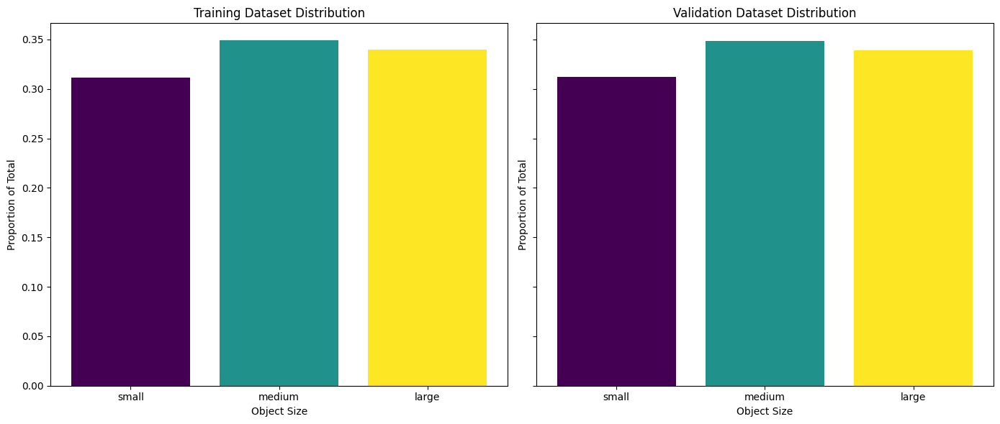

In [179]:
training_proportions = [count / sum(training_object_size_counts.values()) for count in training_object_size_counts.values()]
validation_proportions = [count / sum(validation_object_size_counts.values()) for count in validation_object_size_counts.values()]

labels = training_object_size_counts.keys()

# Plotting with improved colors using the viridis scale
fig, axs = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

colors = plt.cm.viridis(np.linspace(0, 1, len(labels)))

for i, label in enumerate(labels):
    axs[0].bar(label, training_proportions[i], color=colors[i])
    axs[1].bar(label, validation_proportions[i], color=colors[i])

axs[0].set_title('Training Dataset Distribution')
axs[1].set_title('Validation Dataset Distribution')

for ax in axs:
    ax.set_xlabel('Object Size')
    ax.set_ylabel('Proportion of Total')

plt.tight_layout()
plt.show()

The subsequent plot visualizes the proportional distribution of object sizes across the training and validation datasets. This visualization allows for a comparison that accounts for differences in dataset size, highlighting any discrepancies in the representation of object sizes. The relative proprtion of small, medium and large object found on the images can be classified as equal, which show the quality of the data, there is no need for any modification of the train and evaluation data splits, based on object size.

# Backup Dataset

The MS COCO dataset is a well-constructed benchmark dataset. Based on this information and the exploratory data analysis, we can confidently state that there is a low chance of the research failing because of the dataset. However, it is always important to plan for the event of a failing research because of the data used. Thus, it is important to name at least one additional dataset that can or will be utilized during the research. This additional dataset is the [PASCAL VOC](http://host.robots.ox.ac.uk/pascal/VOC/).

The PASCAL VOC dataset is a widely used benchmark dataset containing 1,464 images for training, 1,449 images for validation, and a private set for testing for object recognition and segmentation tasks. It contains images from 20 object classes, including people, animals, vehicles, indoor objects, and one additional background class. The dataset has pixel-level segmentation annotations, bounding box annotations, and object class annotations, which makes it a valuable resource for training and evaluating segmentation models.

```VOC2012_train_val.zip/
├── JPEGImages/
│   ├── <image_name1>.jpg
│   ├── <image_name2>.jpg
│   └── <image_nameN>.jpg
├── Annotations/
│   ├── <image_name1>.xml
│   ├── <image_name2>.xml
│   └── <image_nameN>.xml
├── SegmentationClass/
│   ├── <image_name1>.png
│   ├── <image_name2>.png
│   └── <image_nameN>.png
├── SegmentationObject/
│   ├── <image_name1>.png
│   ├── <image_name2>.png
│   └── <image_nameN>.png
├── ImageSets/
│   └── Main/
│       └── category0_train.txt
│       └── category0_val.txt
│       └── category1_train.txt
│       └── category1_val.txt
│       ...
│   └── Segmentation/
│       └── train.txt
│       └── trainval.txt
│       └── val.txt
```

The file **VOC2012/ImageSets/Main/\<class\> \<imgset\>.txt** contains image identifiers and ground truth for a particular class and image set, for example the file car train.txt applies to the ‘car’ class and train image set. Each line of the file contains a single image identifier and ground truth label, separated by a space, for example: *2009_000040 -1*

The **VOC2012/ImageSets/Segmentation/** directory contains text files specify- ing lists of images for the segmentation task.

### Example

<!-- ![image](example.png) -->


<!-- <p float="left">
  <img src="images/2007_000129.jpg" width="200" />
  <img src="images/2007_000129_segclass.png" width="200" /> 
  <img src="images/2007_000129_segobj.png" width="200" />
</p> -->

Original                   |  Segmentation Class        |    Segmentation Object
:-------------------------:|:-------------------------: | :-------------------------:
![original](images/2007_000129.jpg)  |  ![segmentation class](images/2007_000129_segclass.png)  | ![segmentation class](images/2007_000129_segobj.png)

# References

## Github repository
    https://github.com/mkcsakos/UvA-DS-Master-Thesis-EDA-24

## [MS COCO](https://cocodataset.org/#home):

```
@misc{lin2015microsoft,
      title={Microsoft COCO: Common Objects in Context}, 
      author={Tsung-Yi Lin and Michael Maire and Serge Belongie and Lubomir Bourdev 
      and Ross Girshick and James Hays and Pietro Perona and Deva Ramanan and 
      C. Lawrence Zitnick and Piotr Dollár},
      year={2015},
      eprint={1405.0312},
      archivePrefix={arXiv},
      primaryClass={cs.CV}
}
```

## [PASCAL VOC](http://host.robots.ox.ac.uk/pascal/VOC/):

```
@Article{Everingham15,
   author = "Everingham, M. and Eslami, S. M. A. and Van~Gool, L. and Williams, 
   C. K. I. and Winn, J. and Zisserman, A.",
   title = "The Pascal Visual Object Classes Challenge: A Retrospective",
   journal = "International Journal of Computer Vision",
   volume = "111",
   year = "2015",
   number = "1",
   month = jan,
   pages = "98--136",
}
```